# Digital Signal Processing Project


> Onur Ümit Şener <br>
> Electrical - Electronics Engineering


> - [Data](https://data.mendeley.com/datasets/6rp6wrd2pr)
> 
> - [Article](https://www.sciencedirect.com/science/article/pii/S2352340921009999)
> 
> - [Radar I/Q](https://www.skyradar.com/blog/an-introduction-to-i/q-signals)
 

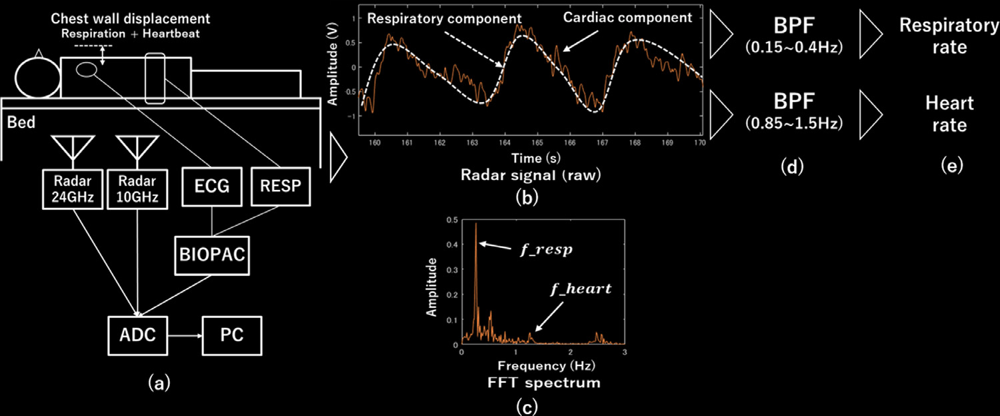

## Import


In [5]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
from scipy.fft import fft, fftfreq
from scipy.signal import butter, filtfilt, freqz

In [6]:
pio.templates.default = 'plotly_dark'

### From Web

In [7]:
# import requests
# url = 'https://data.mendeley.com/public-files/datasets/6rp6wrd2pr/files/14619882-3b80-4f29-9f8d-ca59a0d2d3a0/file_downloaded'
# web_data = requests.get(url, allow_redirects=True)
# with open('data.csv','wb') as f:
#     f.write(web_data.content)
# data = pd.read_csv('data.csv', skiprows=22).drop(columns='Comment')

### From Local

In [8]:
data = pd.read_csv('subject3.csv', skiprows=22).drop(columns='Comment')
sample = data

## Normalizing Function

In [9]:
def normalize(data):
    normalized = (data-np.min(data))/(np.max(data)-np.min(data))
    normalized = normalized - normalized.mean()
    return normalized

## Cutoff Frequencies

In [10]:
cutoff_resp = (.15, .4)
cutoff_ecg = (.85, 1.5)

signal_dict = {'resp': {
                    'name': 'Resp',
                    'cutoff': cutoff_resp},
               'ecg':{
                    'name': 'ECG',
                    'cutoff': cutoff_ecg}}

## Windowing (Boxcar)

In [11]:
sample = data.iloc[180000:240000]

## Assigning Data

In [12]:
x = sample['X_Value']
i = sample['radar24-I']
q = sample['radar24-Q']
ten = sample['radar10-I']
iq = i+q

r = sample['RESP']
c = sample['ECG']

t = x.iloc[-1] - x.iloc[0]
l = x.shape[0]
fs = l//t
l, fs

(60000, 1000.0)

In [33]:
u = normalize(i)
o = -normalize(q)
tn = -normalize(ten)
uo = u+o

In [ ]:
px.line().add_scatter(x=x, y=u, name='I').add_scatter(x=x, y=o, name='Q').add_scatter(x=x, y=tn, name='10-I').add_scatter(x=x, y=uo, name='I+Q').update_layout(height=500)

In [13]:
px.line().add_scatter(x=x, y=c, name='ECG Reference').add_scatter(x=x, y=r, name='Resp Reference').update_layout(height=500)

## Checking the optimal order selection

In [ ]:
fig = make_subplots(
    rows=4, cols=1,
    row_titles=('Bandpass Filter', 'Original','Resp','ECG'),
).update_layout(height=900)


fig.add_scatter(x=x, y=i, name=f'Original Signal', row=2, col=1)

for signal in signal_dict.values():
    for order in [1,2]:
        b, a = butter(order, signal['cutoff'], 'bp', fs=fs)
        w, h = freqz(b, a)
        y = filtfilt(b, a, i)
        fig.add_scatter(x=(fs * 0.5 / np.pi) * w, y=abs(h), name=f'{order} {signal["name"]} Freq')
        if signal["name"] == 'Resp':
            fig.add_scatter(x=x, y=y, name=f'{order} Filtered {signal["name"]}', row=3, col=1)
        else:
            fig.add_scatter(x=x, y=y, name=f'{order} Filtered {signal["name"]}', row=4, col=1)


fig.show()


## Checking the effect of the sequence of normalization

In [37]:
b, a = butter(1, signal_dict['resp']['cutoff'], 'bp', fs=fs)
y = filtfilt(b, a, i)
resp = normalize(y)

In [38]:
u = filtfilt(b, a, normalize(i))

In [ ]:
px.line().add_scatter(x=x,y=resp).add_scatter(x=x,y=y).add_scatter(x=x,y=u)

In [40]:
b, a = butter(1, signal_dict['ecg']['cutoff'], 'bp', fs=fs)
y = filtfilt(b, a, i)
ecg = normalize(y)

## Comparing results to references

In [41]:
fig = make_subplots(
    rows=2, cols=1,
    row_titles=('Bandpass Filter', 'Original','Resp','ECG'),
).update_layout(height=900)

fig.add_scatter(x=x,y=resp, name='filt resp', row=1, col=1)
fig.add_scatter(x=x,y=normalize(r), name='original resp', row=1, col=1)

fig.add_scatter(x=x,y=ecg[:15000], name='filt ecg', row=2, col=1)
fig.add_scatter(x=x,y=normalize(c[:15000]), name='original ecg', row=2, col=1)

fig.show()

## Estimating the frequency with FFT

In [42]:
r_norm = normalize(r.values)
c_norm = normalize(c.values)
for idx, signal in enumerate((resp, r_norm, ecg, c_norm)):
    fft_out = fft(signal)

    frequencies = fftfreq(len(signal), 1/fs)

    max_index =  np.argmax(np.abs(fft_out))

    max_frequency = frequencies[max_index]
    bpm = max_frequency * 60
    match idx:
        case 0:
            text = 'Filtered Resp'
        case 1:
            text = 'Original Resp'
        case 2:
            text = 'Filtered ECG'
        case 3:
            text = 'Original ECG'
    print(f'{text}:')
    print(f'{bpm} BPM')
    print(f'{max_frequency:.3f} Hz \n')

Filtered Resp:
17.0 BPM
0.283 Hz 

Original Resp:
17.0 BPM
0.283 Hz 

Filtered ECG:
72.0 BPM
1.200 Hz 

Original ECG:
72.0 BPM
1.200 Hz 



In [43]:
rng = list(range(100))
fig = make_subplots(
    rows=2, cols=1,
    row_titles=('Resp','ECG'),
).update_layout(height=900)

fig.add_scatter(x=rng,y=abs(fft(resp)[:rng[-1]]), name='filt resp')
fig.add_scatter(x=rng,y=abs(fft(r_norm)[:rng[-1]]),name='original resp' )

fig.add_scatter(x=rng,y=abs(fft(ecg)[:rng[-1]]), name='filt ecg', row=2, col=1)
fig.add_scatter(x=rng,y=abs(fft(c_norm)[:rng[-1]]), name='original ecg', row=2, col=1)

# Window Sliding

In [45]:
buffer_length = int(6e4)
data_length = data.shape[0]
overlap = .5
slide = buffer_length*(1-overlap)

resp_result = np.array([])
ecg_result = np.array([])


for p in range(int(data_length//slide)):
    start = int(p * slide)
    end = start + buffer_length
    # print(start, end)
    if end > data_length:
        break

    signal_data = data['radar24-I'].iloc[start:end].values


    b, a = butter(1, signal_dict['resp']['cutoff'], 'bp', fs=fs)
    signal = normalize(filtfilt(b, a, signal_data))
    fft_out = fft(signal)
    frequencies = fftfreq(len(signal), 1/fs)
    max_index =  np.argmax(np.abs(fft_out))
    max_frequency = frequencies[max_index]
    bpm = max_frequency * 60
    resp_result = np.append(resp_result, bpm)


    b, a = butter(1, signal_dict['ecg']['cutoff'], 'bp', fs=fs)
    signal = normalize(filtfilt(b, a, signal_data))
    fft_out = fft(signal)
    frequencies = fftfreq(len(signal), 1/fs)
    max_index =  np.argmax(np.abs(fft_out))
    max_frequency = frequencies[max_index]
    bpm = max_frequency * 60
    ecg_result = np.append(ecg_result, bpm)

print(resp_result.mean())
print(ecg_result.mean())


16.736842105263158
71.42105263157895


### Comparison with the article

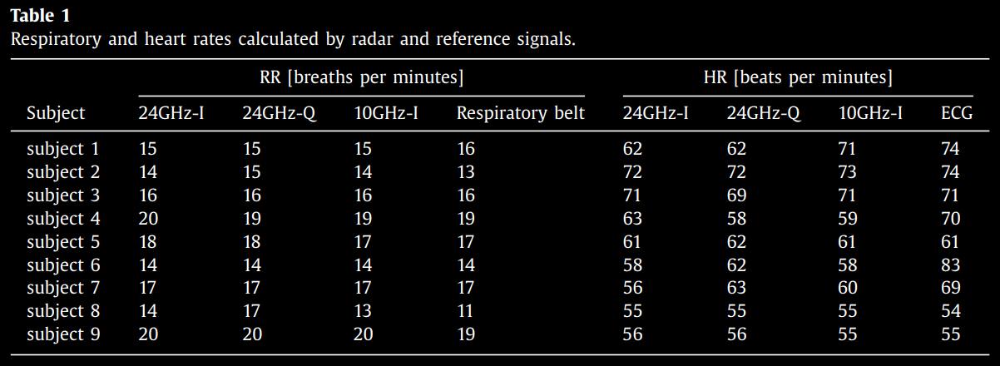